# Read Image & Pre processed

{'image_size': 1024, 'rmin': 1, 'rmax': 10, 'neighborhood_size': 5, 'threshold': 1, 'fthreshold': 1}
{'image_size': 1024, 'rmin': 1, 'rmax': 10, 'neighborhood_size': 5, 'threshold': 1, 'fthreshold': 1}


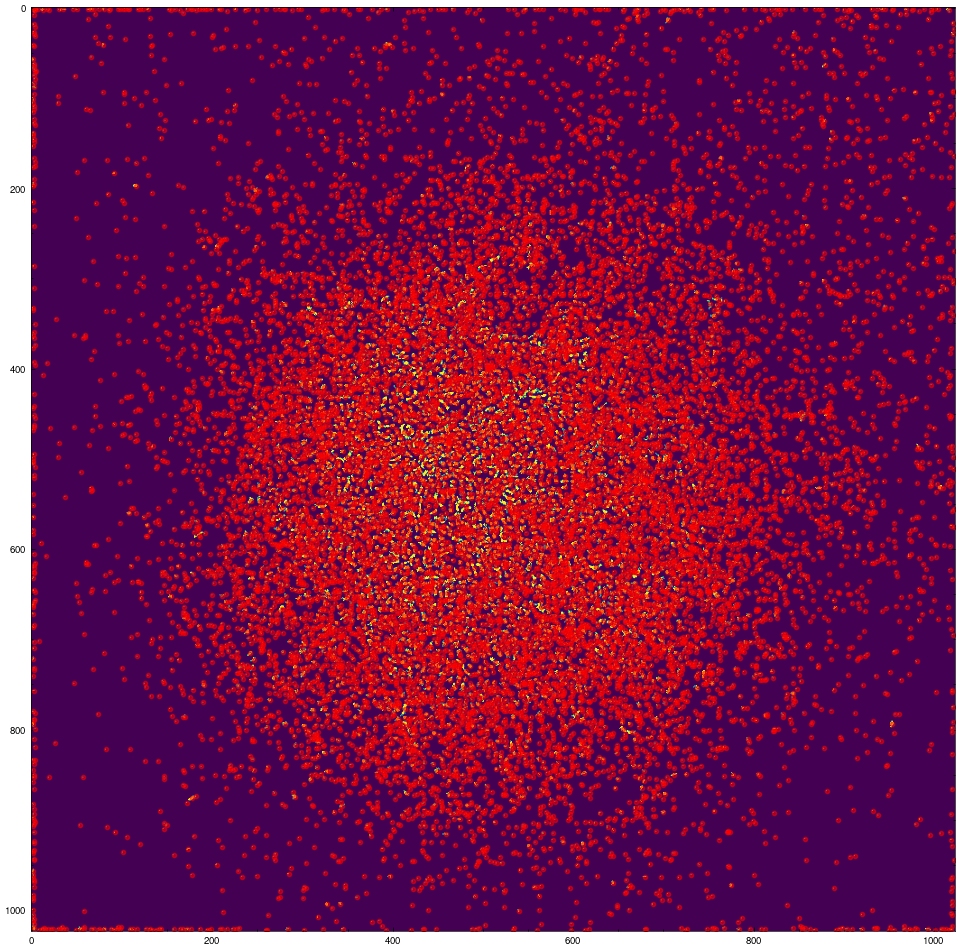

In [ ]:
import localize
from config import reload_settings, settings
# 先查看当前 settings 值
print(localize.settings.LOCS_CONFIG)
reload_settings()
# 再次检查是否更新
print(localize.settings.LOCS_CONFIG)

locs = localize.LocsExtractor(settings.file_path)
locs.load_images_and_compute_locs(start_frame=settings.start_frame,end_frame=settings.end_frame)
locs.cal_freq_and_plot()

{'image_size': 1024, 'rmin': 1, 'rmax': 10, 'neighborhood_size': 5, 'threshold': 1, 'frmin': 1, 'frmax': 10, 'fneighborhood_size': 9, 'fthreshold': 0.05}
{'image_size': 1024, 'rmin': 1, 'rmax': 10, 'neighborhood_size': 5, 'threshold': 1, 'frmin': 1, 'frmax': 10, 'fneighborhood_size': 9, 'fthreshold': 0.05}


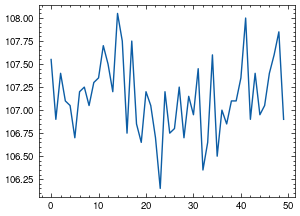

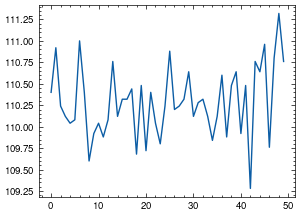

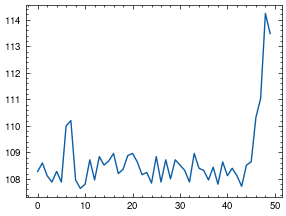

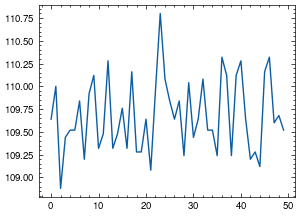

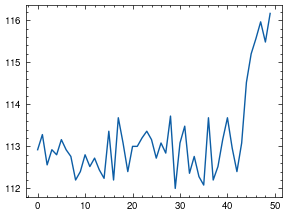

...

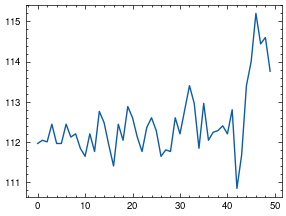

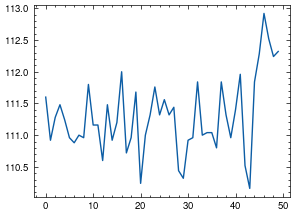

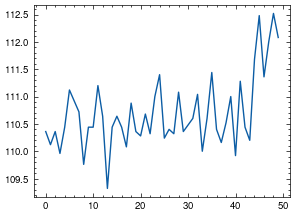

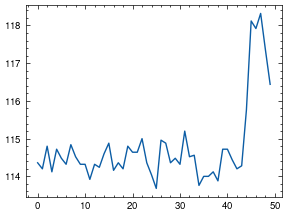

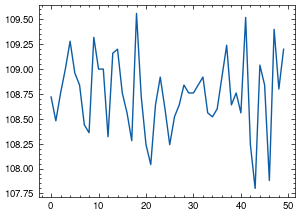

In [ ]:
# 先查看当前 settings 值
print(localize.settings.LOCS_CONFIG)
reload_settings()
# 再次检查是否更新
print(localize.settings.LOCS_CONFIG)

locs.extract_sequences(start_frame=settings.start_frame,end_frame=settings.end_frame)
locs.plot_sequences()


In [3]:
locs.sequences.shape

(50, 15435)

In [ ]:
import timeit
import random
from itertools import chain

# 生成模拟的多线程返回结果
def generate_mock_data(num_threads=32, max_points=10):
    return [
        ([random.random(0, 100) for _ in range(random.randint(1, max_points))],  # x 坐标
         [random.randint(0, 100) for _ in range(random.randint(1, max_points))])  # y 坐标
        for _ in range(num_threads)
    ]

# 方法 1：使用 extend() 逐个展开
def method_extend(results):
    xs, ys = [], []
    for x, y in results:
        xs.extend(x)
        ys.extend(y)
    return xs, ys

# 方法 2：使用 itertools.chain() 展平
def method_chain(results):
    xs, ys = zip(*results)
    return list(chain(*xs)), list(chain(*ys))

# 生成模拟数据
mock_data = generate_mock_data(num_threads=1000, max_points=20)

# 计时
time_extend = timeit.timeit(lambda: method_extend(mock_data), number=100)
time_chain = timeit.timeit(lambda: method_chain(mock_data), number=100)

# 输出结果
print(f"Method extend(): {time_extend:.6f} seconds")
print(f"Method chain():  {time_chain:.6f} seconds")


Method extend(): 0.008240 seconds
Method chain():  0.016304 seconds


In [3]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import imgrvt as rvt

import scipy
import scipy.ndimage as ndimage
import scipy.ndimage.filters as filters



import imageio.v3 as imageio
import os
from scipy import stats
import re



def extract_number(filename):
    # 使用正则表达式提取文件名中最后一个下划线和.tif之间的数字
    match = re.search(r'_(\d+)\.tiff$', filename)
    if match:
        return int(match.group(1))
    else:
        return -1

def load_images_from_folder(folder, start_frame, end_frame):
    
    images = []
    filenames = sorted([f for f in os.listdir(folder) if f.endswith(".tiff")], key=extract_number)
    #print(filenames[450:500])
    if start_frame is None and end_frame is None:
        start_frame = 0
        end_frame = len(filenames)
    for i in range(start_frame - 1, end_frame):  # Adjust for 0-based indexing
        img = imageio.imread(os.path.join(folder, filenames[i])).astype(np.uint16)
        images.append(img)
    return images

def load_images(path, start_frame=None, end_frame=None):
    if path.endswith('.tif'):
        images = imageio.imread(path)[start_frame-1:end_frame]
    else:
        images = load_images_from_folder(path, start_frame, end_frame)
    return images

def calculate_mode(images):
    # Stack images into a 3D array (depth, height, width)
    stack = np.stack(images, axis=0)
    # Calculate mode along the first axis (depth)
    mode_image, _ = stats.mode(stack, axis=0)
    return mode_image

def save_image(image, output_path):
    imageio.imwrite(output_path, image.astype(np.uint16))

def frame_process_func(image,threshold=1,neighborhood_size=5):
    timg=rvt.rvt(image,rmin=1,rmax=10)    

    data = timg

    data_max = filters.maximum_filter(data, neighborhood_size)
    maxima = (data == data_max)
    data_min = filters.minimum_filter(data, neighborhood_size)
    diff = ((data_max - data_min) > threshold)
    maxima[diff == 0] = 0

    labeled, num_objects = ndimage.label(maxima)
    slices = ndimage.find_objects(labeled)
    # xy = []
    # for dy,dx in slices:
    #     x_center = (dx.start + dx.stop - 1)/2
        
    #     y_center = (dy.start + dy.stop - 1)/2
    #     xy.append([x_center,y_center])
    # return xy
    x, y = [], []
    for dy,dx in slices:
        x_center = (dx.start + dx.stop - 1)/2
        x.append(x_center)
        y_center = (dy.start + dy.stop - 1)/2
        y.append(y_center)
    return x,y


def plot_comparison(src, results, titles=None): # plot several images to compare different RVT parameters
    nres=len(results)
    _,axes=plt.subplots(1,nres+1,figsize=(4*nres+4,3))
    axes[0].imshow(src,cmap="gray")
    axes[0].set_title("Source")
    for ax,res,t in zip(axes[1:],results,titles or [None]*nres):
        ax.imshow(res,cmap="inferno")
        if t:
            ax.set_title(t)
    plt.show()

def read_tif_multiframe(file_path):
    image = Image.open(file_path)
    num_frames = getattr(image, 'n_frames', 1)
    print(f'帧数: {num_frames}')
    image_list_temp = []
    for frame in range(num_frames):
        image.seek(frame)  # 定位到当前帧
        image_list_temp.append(np.array(image))
    return np.array(image_list_temp,dtype=np.float32)


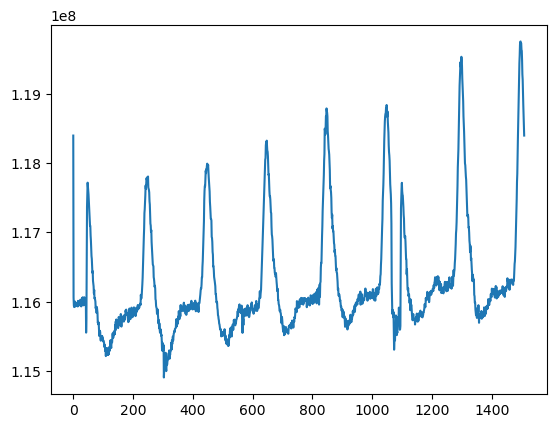

int64


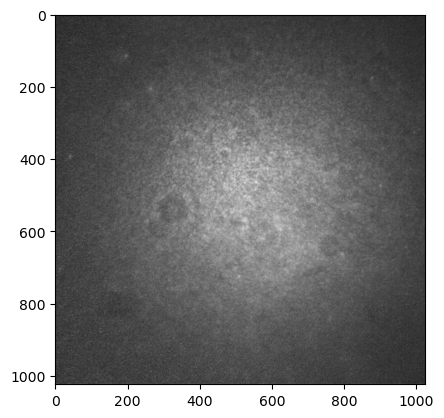

In [4]:
# Folder containing TIF images
folder_path = "/data/nas-shared/LinWF data/Single molecule fluorescence microscopy data/240722yyx/8triangle/"
image_array = np.array(load_images(folder_path))
#############
## pre process
#############
# 强度变化 选择稳定的

intensity = np.sum(np.sum(image_array,axis=1),axis=1)
plt.plot(intensity)
plt.show()
## 这里选取 1000 帧开始
temp = image_array#[1000:,:,:]
intensity_temp = np.sum(np.sum(temp,axis=1),axis=1)
for i in range(len(intensity_temp)):
    temp[i,:,:] = temp[i,:,:]*np.mean(intensity_temp)/intensity_temp[i]
from scipy import stats
temp_mode, _ = stats.mode(temp, axis=0)
print(temp_mode.dtype)
plt.imshow(temp_mode,cmap="gray")
plt.show()
temp_array = temp-temp_mode

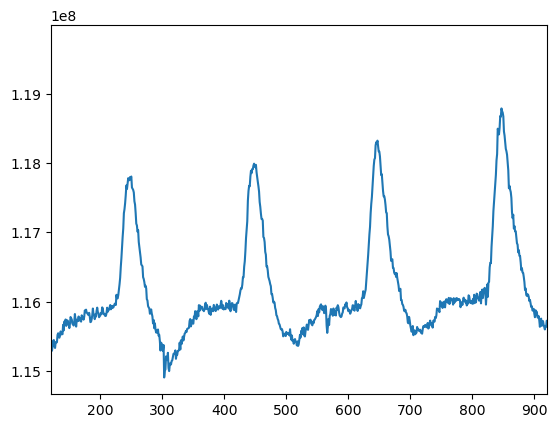

In [5]:
plt.plot(intensity)
ast = 120
plt.xlim([ast,ast+800])
plt.show()

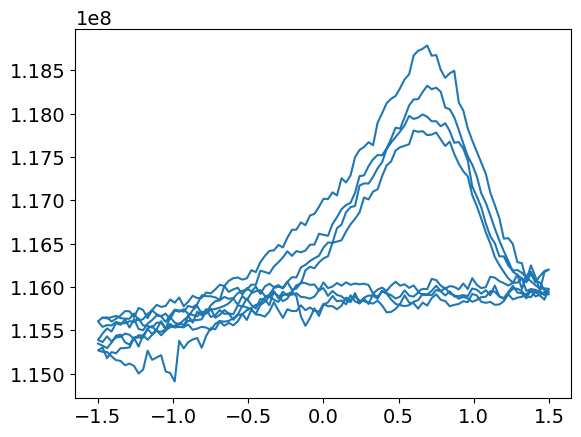

In [21]:
Vbegin = -1.5
Vend = 0
Von = 1.5
Voff = -1.5
Number_V = 31  

Tbegin = 20
Ton = 100
Toff = 100
Tend = 10
Tzero = 10
Rep_Times = 4
sig = np.concatenate([
    np.linspace(Voff,Von,Ton,endpoint=False),
    np.linspace(Von,Voff,Toff,endpoint=False),
])
sig = np.tile(sig,Rep_Times)
plt.plot(sig, intensity[ast:ast+800])
plt.show()
# sig = np.concatenate([
#     np.zeros(Tzero),
#     Vbegin*np.ones(Tbegin),
#     sig,
#     Vend*np.ones(Tend),
#     np.zeros(Tzero)
# ])

# 对每一帧进行处理

In [6]:
xs, ys = [], []
id_frame = []
from tqdm import tqdm
for i,image in tqdm(enumerate(temp_array)):    
    ex, ey = frame_process_func(image,threshold=1,neighborhood_size=5)
    if len(ex)>0:
        id_frame.append(i)
        xs.append(ex)
        ys.append(ey)

0it [00:00, ?it/s]/tmp/ipykernel_1048651/2449193969.py:62: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(data, neighborhood_size)
/tmp/ipykernel_1048651/2449193969.py:64: DeprecationWarning: Please use `minimum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_min = filters.minimum_filter(data, neighborhood_size)
1509it [06:56,  3.62it/s]


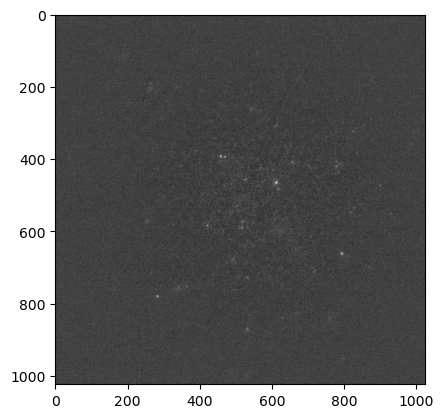

/tmp/ipykernel_1048651/2449193969.py:62: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(data, neighborhood_size)
/tmp/ipykernel_1048651/2449193969.py:64: DeprecationWarning: Please use `minimum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_min = filters.minimum_filter(data, neighborhood_size)


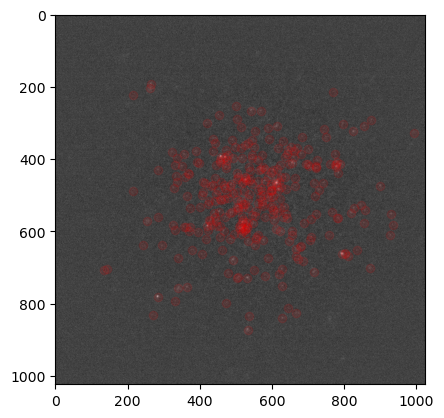

In [7]:

plt.imshow(temp_array[10,:,:],cmap='grey')
plt.show()
ex, ey = frame_process_func(temp_array[10,:,:],threshold=1,neighborhood_size=5)
plt.imshow(temp_array[10,:,:],cmap='grey')
plt.plot(ex,ey, 'ro',alpha=0.1)
plt.show()

[0.000e+00 1.000e+00 2.000e+00 ... 1.022e+03 1.023e+03 1.024e+03]
175186


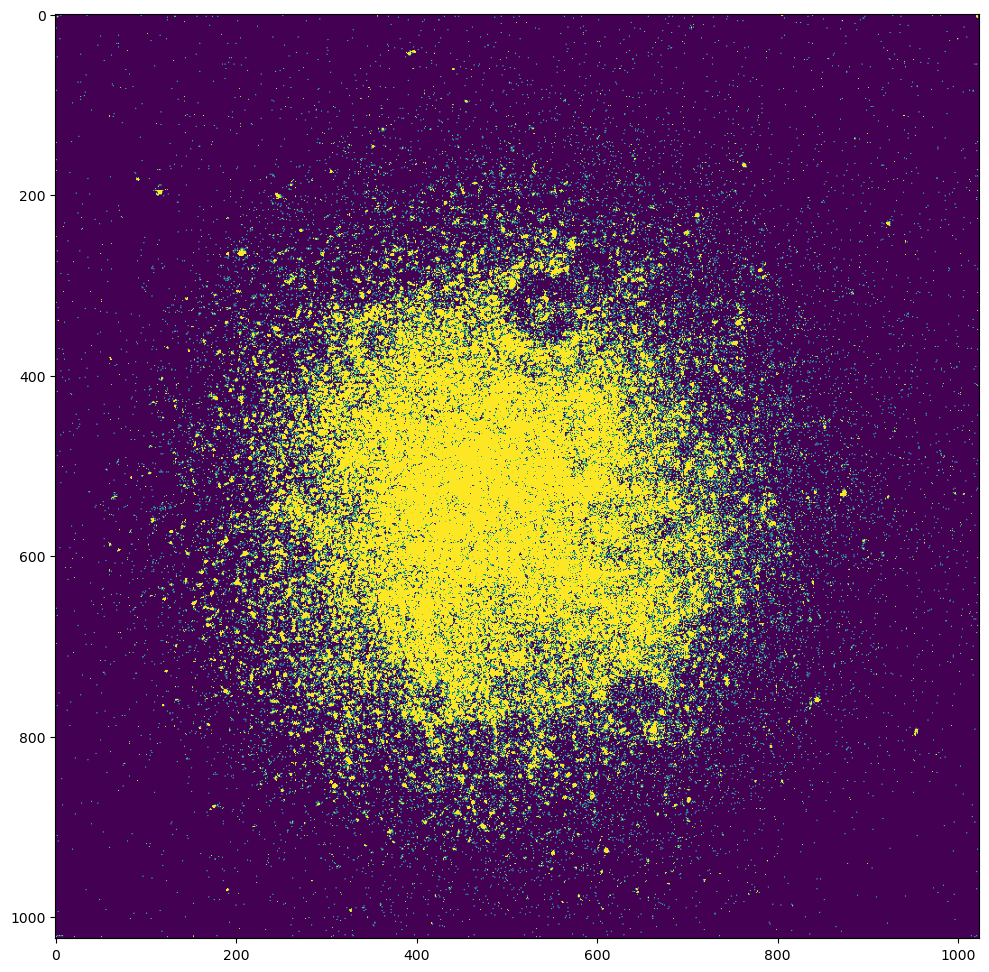

/tmp/ipykernel_1048651/2449193969.py:62: DeprecationWarning: Please use `maximum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_max = filters.maximum_filter(data, neighborhood_size)
/tmp/ipykernel_1048651/2449193969.py:64: DeprecationWarning: Please use `minimum_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  data_min = filters.minimum_filter(data, neighborhood_size)


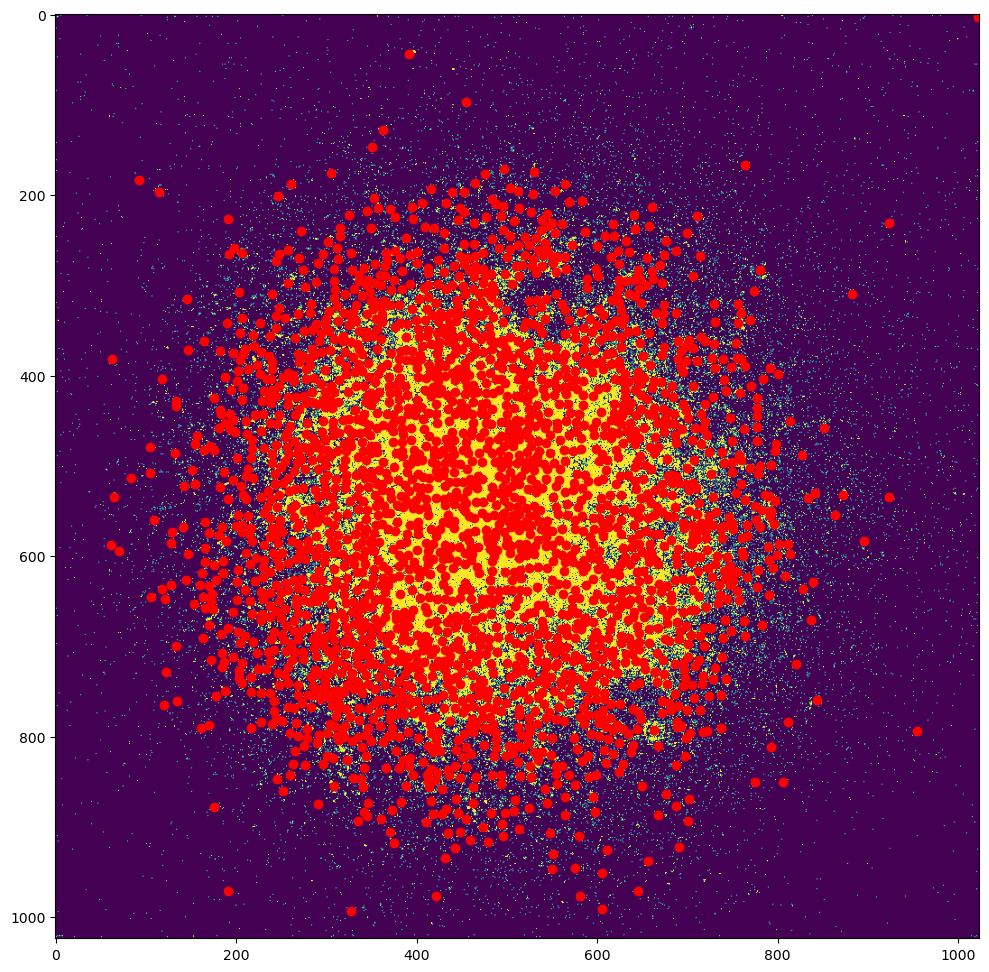

In [8]:
# 创建二维直方图
x_ = [item for sublist in xs for item in sublist]
y_ = [item for sublist in ys for item in sublist]
frequency_matrix, xedges, yedges = np.histogram2d(x_, y_, bins=1024,range=[[0, 1024], [0, 1024]])
print(xedges)
print(len(np.argwhere(frequency_matrix)))
plt.figure(figsize=(12,12))
plt.imshow(frequency_matrix, vmax=1)
plt.show()
ex, ey = frame_process_func(frequency_matrix,threshold=0.05,neighborhood_size=8)
plt.figure(figsize=(12,12))
plt.imshow(frequency_matrix,vmax=1)
plt.plot(ex,ey, 'ro')
plt.show()

Blobs 的中心点: [(1.0, 6.0), (1.0, 35.0), (1.0, 95.0), (1.0, 252.0), (1.5, 357.0), (1.0, 805.5), (1.0, 839.0), (1.0, 928.0), (1.0, 972.0), (1.0, 981.0), (2.0, 1021.5), (2.3333333333333335, 2.3333333333333335), (2.0, 132.5), (2.0, 157.0), (2.0, 167.0), (2.0, 174.0), (2.0, 180.0), (2.0, 369.0), (2.0, 431.0), (2.0, 443.0), (2.0, 447.0), (2.0, 494.0), (2.0, 514.0), (2.0, 564.0), (2.0, 583.0), (2.0, 657.0), (2.0, 680.0), (2.0, 684.0), (2.0, 706.0), (2.0, 745.0), (2.0, 834.0), (2.0, 897.0), (2.0, 937.0), (3.0, 124.0), (3.0, 380.0), (3.0, 487.0), (3.0, 508.0), (3.0, 729.0), (4.0, 574.0), (4.0, 697.0), (4.0, 808.0), (4.0, 895.5), (5.0, 293.0), (5.0, 676.0), (5.0, 744.0), (5.0, 851.0), (6.0, 124.0), (6.0, 391.0), (6.0, 409.0), (6.0, 425.0), (6.0, 602.0), (6.0, 892.0), (7.0, 202.0), (7.0, 278.0), (7.0, 756.0), (7.0, 762.0), (7.0, 872.0), (8.0, 143.0), (8.0, 407.0), (9.0, 511.0), (9.0, 522.0), (9.0, 638.0), (9.0, 821.0), (9.0, 826.0), (10.0, 494.0), (10.0, 679.0), (10.0, 886.0), (11.0, 372.0), (11.0,

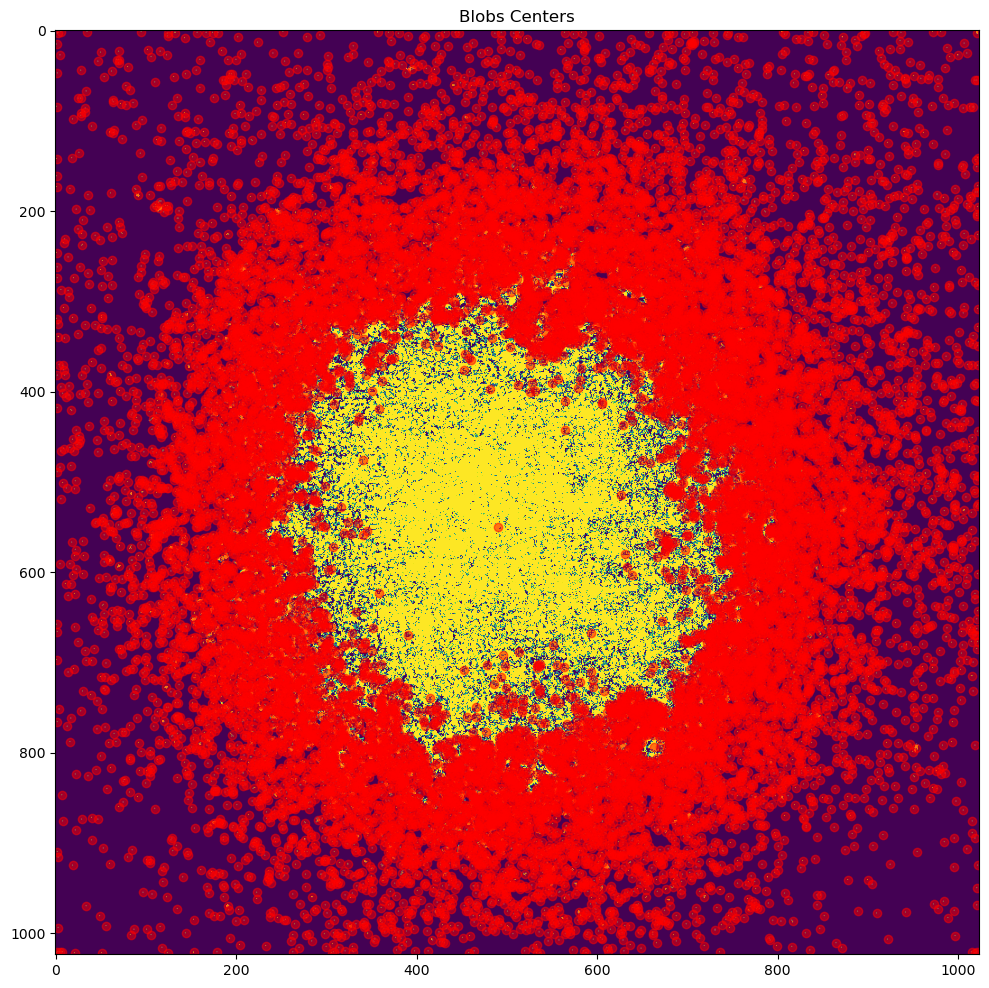

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import measure, io, color

# 读取图像
image = frequency_matrix

# 二值化图像
binary_image = image >= 1  # 你可以调整阈值

# 查找所有 blobs
label_image = measure.label(binary_image)

# 计算每个 blob 的中心
properties = measure.regionprops(label_image)

# 存储 blobs 的中心
centers = []

for prop in properties:
    centers.append(prop.centroid)

# 打印中心点
print("Blobs 的中心点:", centers)
print(len(centers))
# 可视化中心点
plt.figure(figsize=(12,12))
plt.imshow(image,vmax=1)
for center in centers:
    plt.plot(center[1], center[0], 'ro',alpha =0.5)  # 注意 y, x 顺序
plt.title('Blobs Centers')
plt.show()

In [10]:
print(len(centers))
selected_cs = []
for y, x in centers:
    x_min = 400
    x_max = 600
    y_min = 400
    y_max = 600
    if x > x_min and x < x_max:
        if y > y_min and y < y_max:
            selected_cs.append([y,x])
print(len(selected_cs))

17552
3


In [11]:
for i, (x,y) in enumerate(tqdm(centers)):
    print(i,x ,y)

100%|██████████| 17552/17552 [00:00<00:00, 124078.78it/s]

0 1.0 6.0
1 1.0 35.0
2 1.0 95.0
3 1.0 252.0
4 1.5 357.0
5 1.0 805.5
6 1.0 839.0
7 1.0 928.0
8 1.0 972.0
9 1.0 981.0
10 2.0 1021.5
11 2.3333333333333335 2.3333333333333335
12 2.0 132.5
13 2.0 157.0
14 2.0 167.0
15 2.0 174.0
16 2.0 180.0
17 2.0 369.0
18 2.0 431.0
19 2.0 443.0
20 2.0 447.0
21 2.0 494.0
22 2.0 514.0
23 2.0 564.0
24 2.0 583.0
25 2.0 657.0
26 2.0 680.0
27 2.0 684.0
28 2.0 706.0
29 2.0 745.0
30 2.0 834.0
31 2.0 897.0
32 2.0 937.0
33 3.0 124.0
34 3.0 380.0
35 3.0 487.0
36 3.0 508.0
37 3.0 729.0
38 4.0 574.0
39 4.0 697.0
40 4.0 808.0
41 4.0 895.5
42 5.0 293.0
43 5.0 676.0
44 5.0 744.0
45 5.0 851.0
46 6.0 124.0
47 6.0 391.0
48 6.0 409.0
49 6.0 425.0
50 6.0 602.0
51 6.0 892.0
52 7.0 202.0
53 7.0 278.0
54 7.0 756.0
55 7.0 762.0
56 7.0 872.0
57 8.0 143.0
58 8.0 407.0
59 9.0 511.0
60 9.0 522.0
61 9.0 638.0
62 9.0 821.0
63 9.0 826.0
64 10.0 494.0
65 10.0 679.0
66 10.0 886.0
67 11.0 372.0
68 11.0 707.0
69 11.0 718.0
70 11.0 834.0
71 11.0 936.0
72 12.0 171.0
73 12.0 704.0
74 12.0 945.0

17552
60


  0%|          | 0/3 [00:00<?, ?it/s]

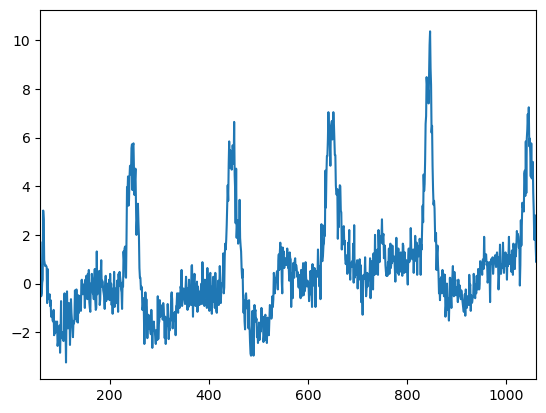

100%|██████████| 3/3 [00:00<00:00, 53.11it/s]


In [12]:
print(len(centers))
from scipy.signal import savgol_filter
start_sig = 60 + len(temp_array)
start = 60
print(start)
for i, (y, x) in enumerate(tqdm(selected_cs)):
    if i%40==0:
        x_r, y_r = round(x), round(y)
        #plt.plot(savgol_filter(np.mean(np.mean(temp_array[:,x_r-2:x_r+3,y_r-2:y_r+3],axis=1),axis=1),21,2))
        plt.plot(np.mean(np.mean(temp_array[:,x_r-3:x_r+2,y_r-3:y_r+2],axis=1),axis=1))
        plt.xlim([start,start+1000])
        #plt.ylim([0,6])
        plt.show()


In [13]:
print(len(centers))
selected_cs = []
for y, x in centers:
    x_min = 100
    x_max = 300
    y_min = 100
    y_max = 300
    if x > x_min and x < x_max:
        if y > y_min and y < y_max:
            selected_cs.append([y,x])
print(len(selected_cs))


17552
503


17552


  0%|          | 0/503 [00:00<?, ?it/s]

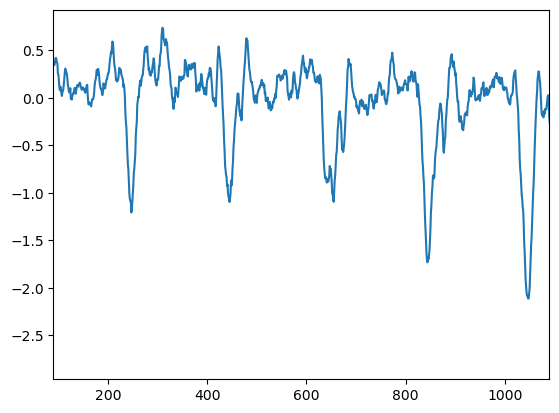

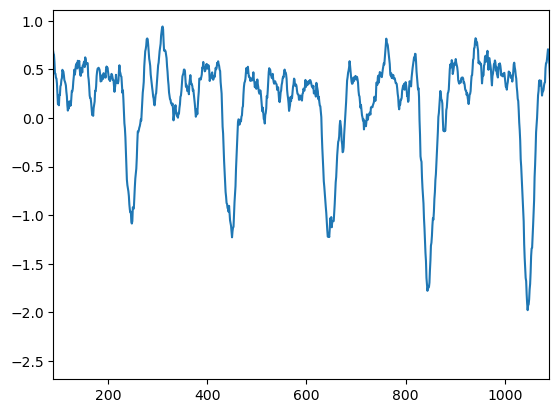

 10%|█         | 51/503 [00:00<00:01, 448.18it/s]

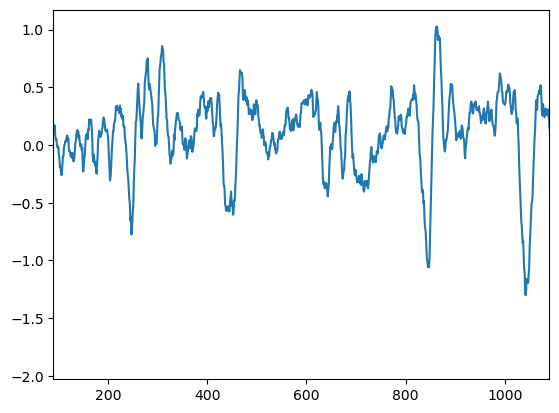

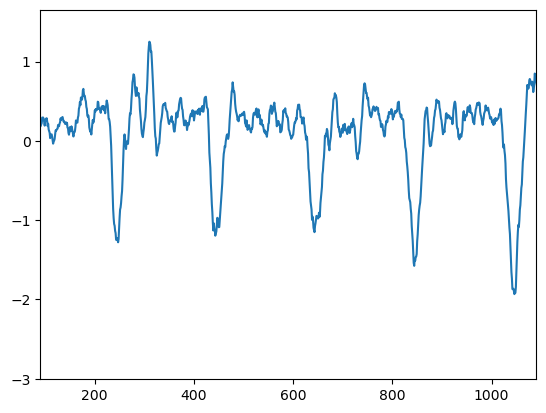

 30%|███       | 151/503 [00:00<00:00, 729.53it/s]

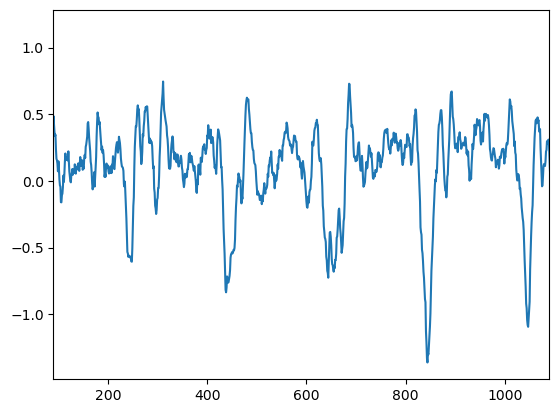

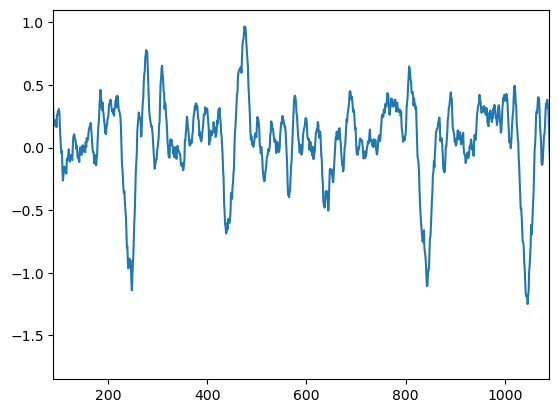

 50%|████▉     | 251/503 [00:00<00:00, 825.02it/s]

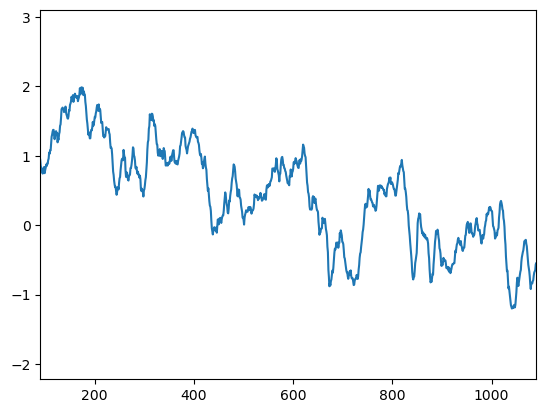

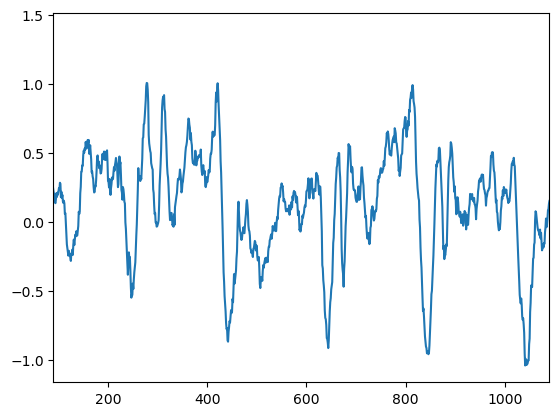

 70%|██████▉   | 351/503 [00:00<00:00, 870.80it/s]

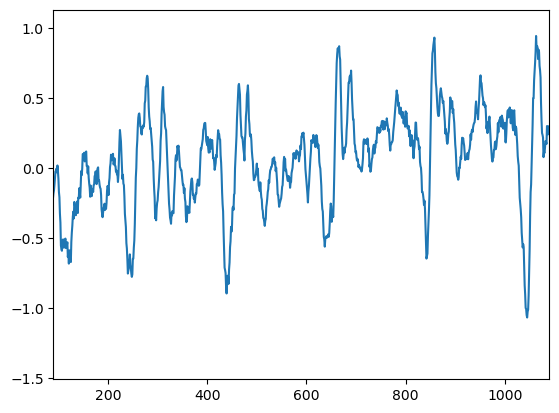

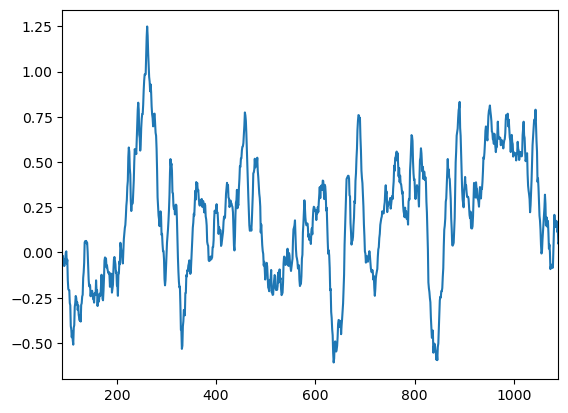

 90%|████████▉ | 451/503 [00:00<00:00, 876.09it/s]

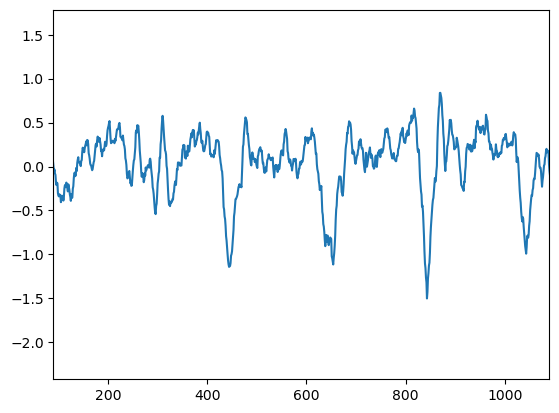

100%|██████████| 503/503 [00:00<00:00, 835.49it/s]


In [14]:
print(len(centers))
from scipy.signal import savgol_filter
start_sig = -60 + len(temp_array)
start = len(temp_array) - start_sig + 30
for i, (y, x) in enumerate(tqdm(selected_cs)):
    if i%50==0:
        x_r, y_r = round(x), round(y)
        plt.plot(savgol_filter(np.mean(np.mean(temp_array[:,x_r-2:x_r+3,y_r-2:y_r+3],axis=1),axis=1),21,2))
        #plt.plot(np.mean(np.mean(temp_array[:,x_r-3:x_r+2,y_r-3:y_r+2],axis=1),axis=1))
        #plt.ylim([0,6])
        plt.xlim([start,start+1000])
        plt.show()

In [15]:
Vbegin = -1.5
Vend = 0
Von = 1.5
Voff = -1.5
Number_V = 31  

Tbegin = 20
Ton = 100
Toff = 100
Tend = 10
Tzero = 10
Rep_Times = 4
sig = np.concatenate([
    np.linspace(Voff,Von,Ton,endpoint=False),
    np.linspace(Von,Voff,Toff,endpoint=False),
])
sig = np.tile(sig,Rep_Times)
# sig = np.concatenate([
#     np.zeros(Tzero),
#     Vbegin*np.ones(Tbegin),
#     sig,
#     Vend*np.ones(Tend),
#     np.zeros(Tzero)
# ])

  0%|          | 0/503 [00:00<?, ?it/s]

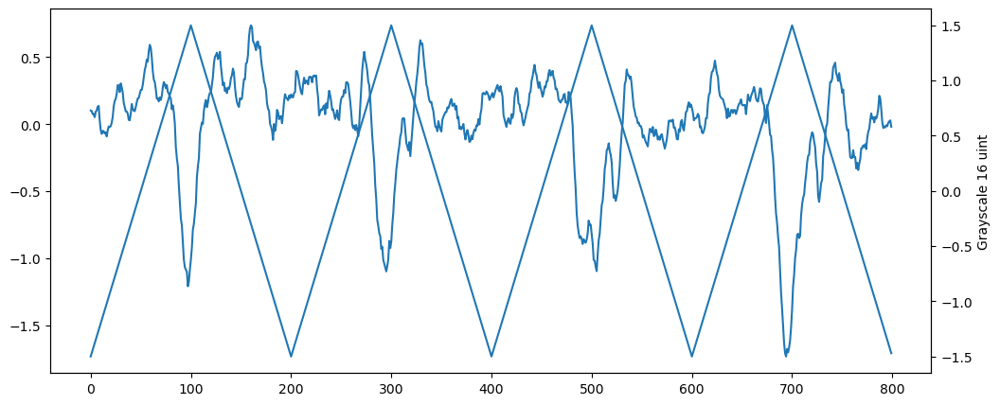

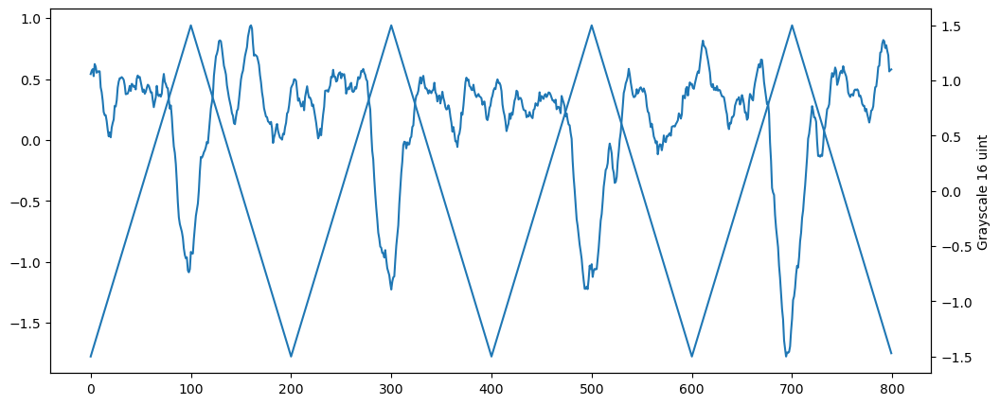

 10%|█         | 51/503 [00:00<00:01, 262.01it/s]

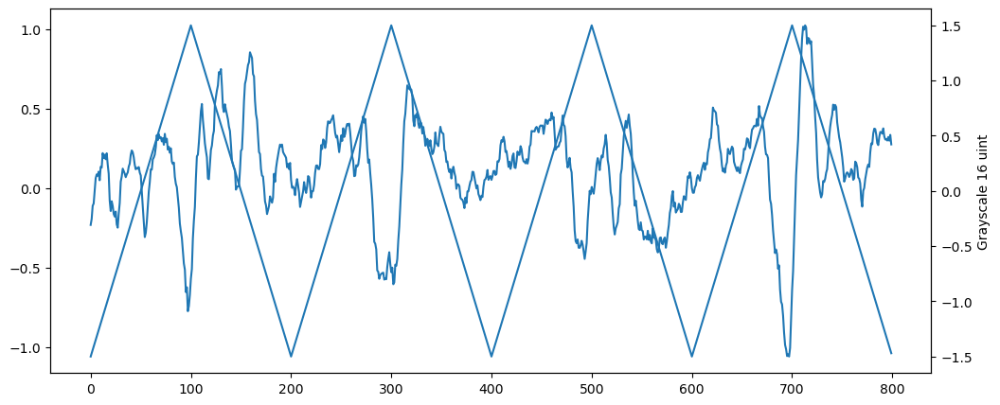

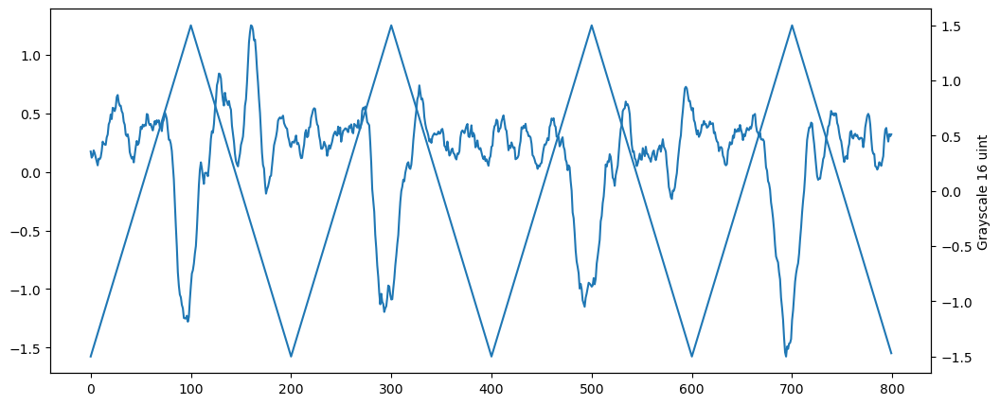

 30%|███       | 151/503 [00:00<00:00, 409.76it/s]

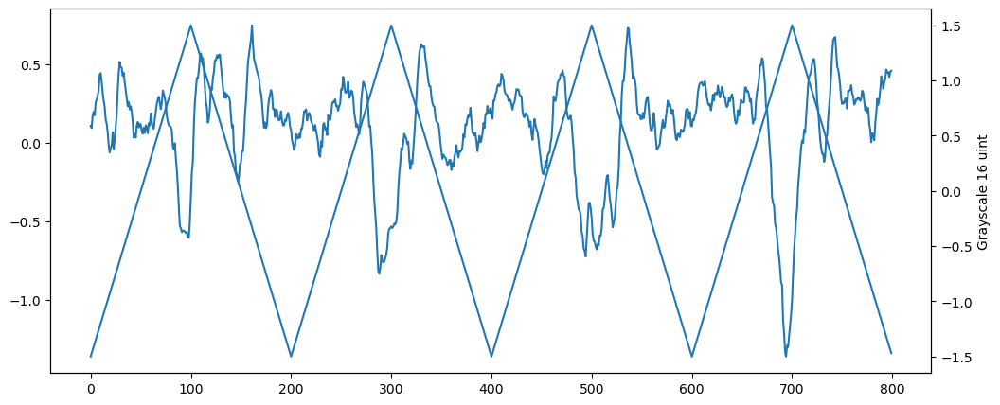

 40%|███▉      | 201/503 [00:01<00:02, 118.92it/s]

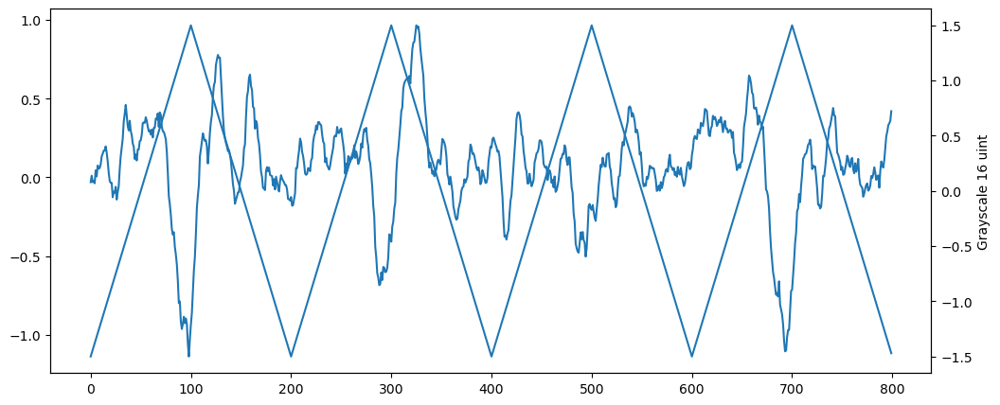

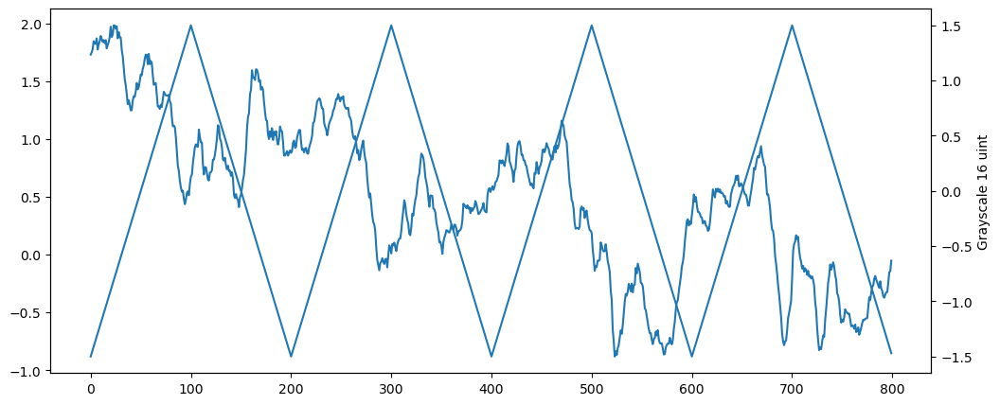

 60%|█████▉    | 301/503 [00:01<00:01, 192.20it/s]

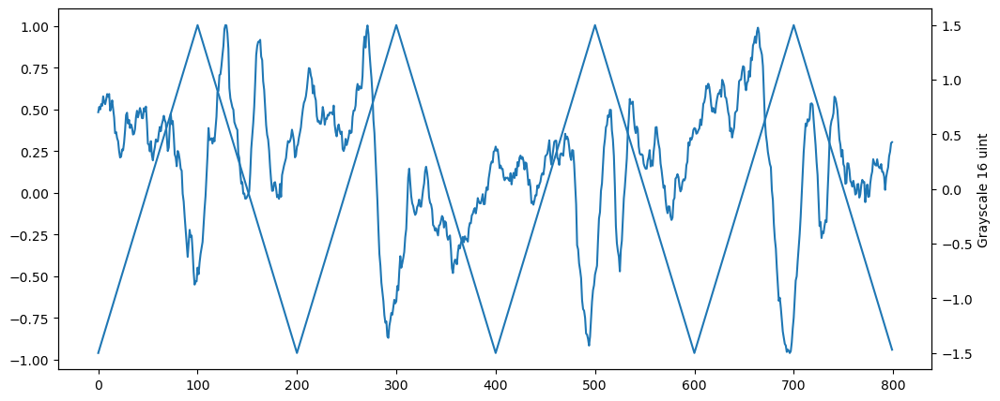

 70%|██████▉   | 351/503 [00:01<00:00, 227.94it/s]

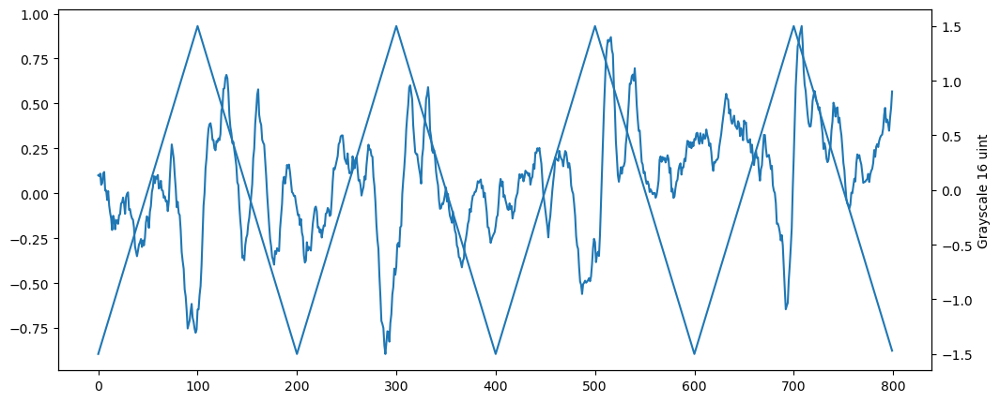

 80%|███████▉  | 401/503 [00:01<00:00, 266.13it/s]

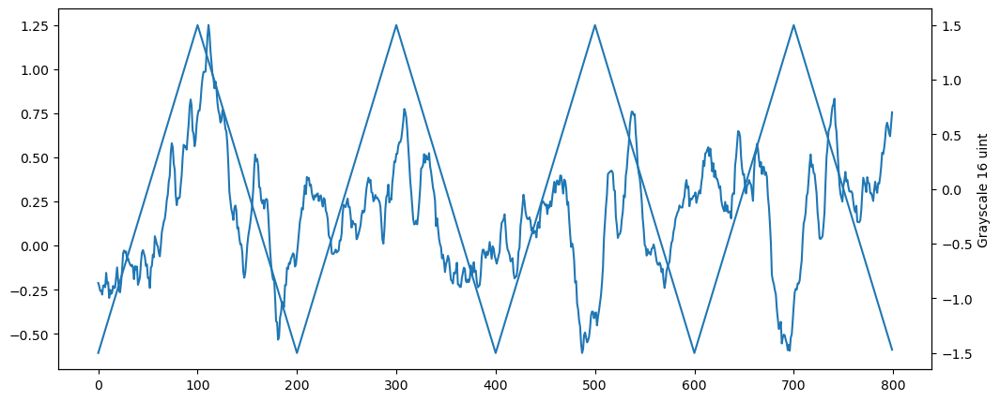

 90%|████████▉ | 451/503 [00:01<00:00, 304.78it/s]

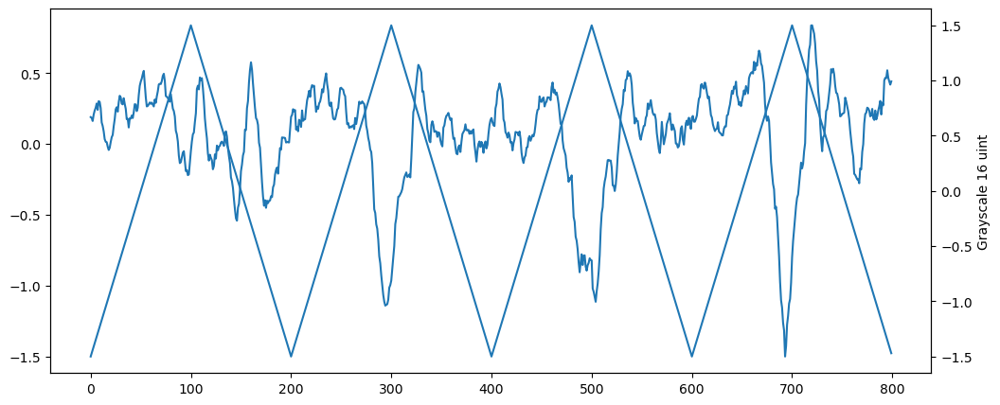

100%|██████████| 503/503 [00:01<00:00, 254.26it/s]


In [16]:
start = 150
for i, (y, x) in enumerate(tqdm(selected_cs)):
    if i%50==0:
        x_r, y_r = round(x), round(y)
        plot_voltage = sig#[start:start+1000]
        plot_intensity = savgol_filter(np.mean(np.mean(temp_array[:,x_r-2:x_r+3,y_r-2:y_r+3],axis=1),axis=1),21,2)[start:start+800]
        
        #plot_voltage = plot_voltage.reshape(4,200).mean(axis=0)
        #plot_intensity = plot_intensity.reshape(4,200)
        #plot_intensity_std = plot_intensity.std(axis=0)
        #plot_intensity_mean = plot_intensity.mean(axis=0)
        #print(plot_voltage.shape, plot_intensity_mean.shape, plot_intensity_std.shape)
        # 绘制带有误差条的折线图
        #plt.errorbar(plot_voltage, plot_intensity_mean, fmt='-o', ecolor='r', capsize=5, capthick=2, markerfacecolor='blue',markersize =1.5)
        fig, ax1 = plt.subplots(figsize=(12, 5))
        ax1.plot(plot_intensity)
        ax2 = ax1.twinx()
        ax2.plot(plot_voltage)
        plt.ylabel('Grayscale 16 uint')
        plt.xlabel('Voltage (V)')
        plt.show()

  0%|          | 0/503 [00:00<?, ?it/s]

(200,) (200,) (200,)


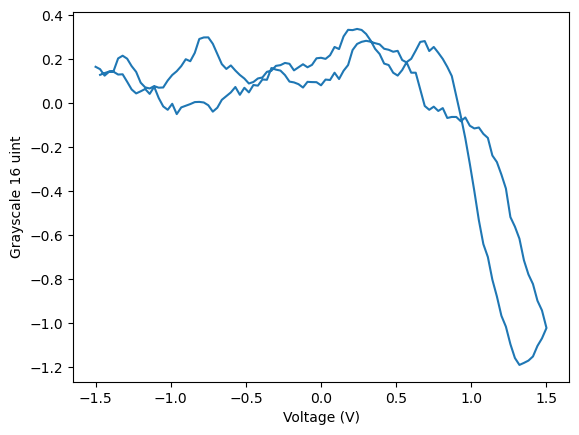

(200,) (200,) (200,)


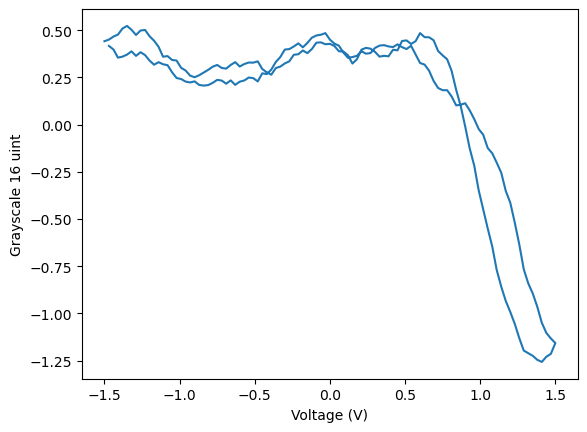

 10%|█         | 51/503 [00:00<00:01, 398.13it/s]

(200,) (200,) (200,)


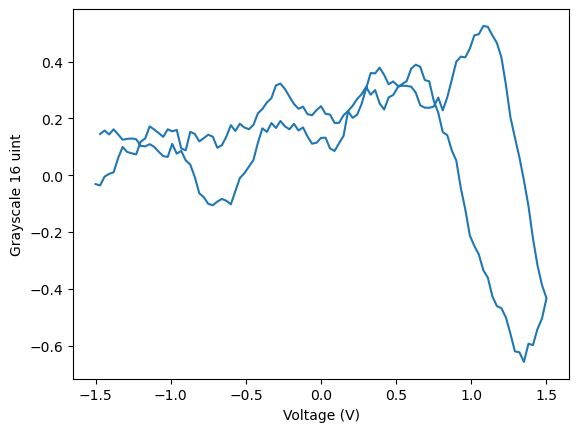

(200,) (200,) (200,)


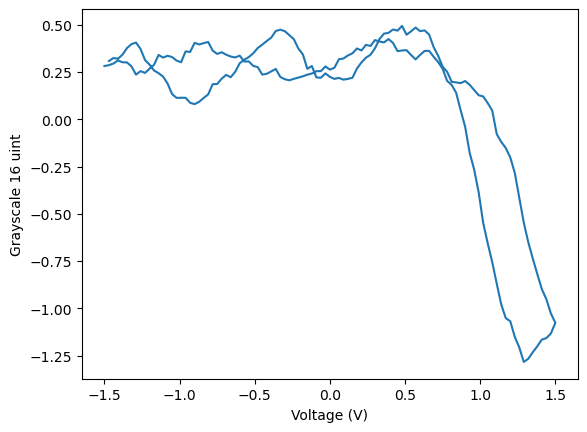

 30%|███       | 151/503 [00:00<00:00, 636.21it/s]

(200,) (200,) (200,)


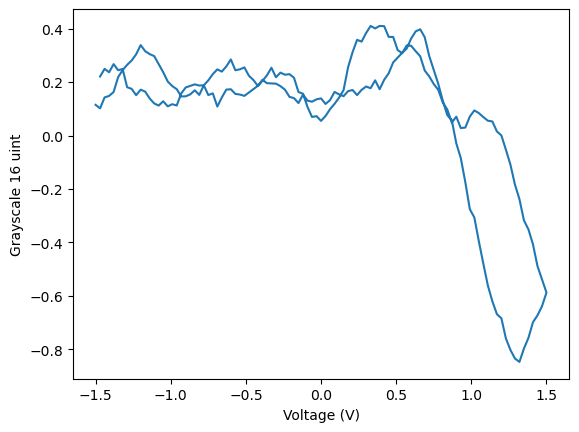

(200,) (200,) (200,)


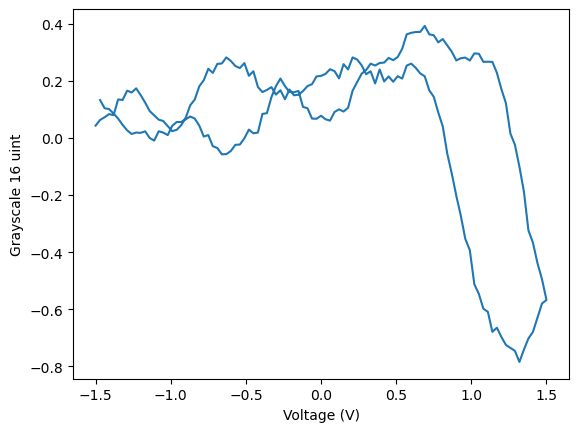

 50%|████▉     | 251/503 [00:00<00:00, 713.68it/s]

(200,) (200,) (200,)


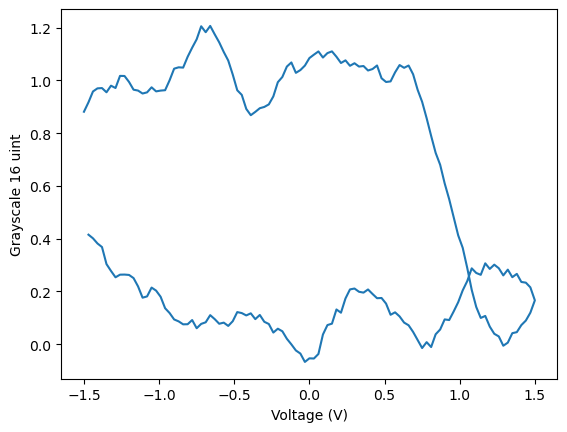

(200,) (200,) (200,)


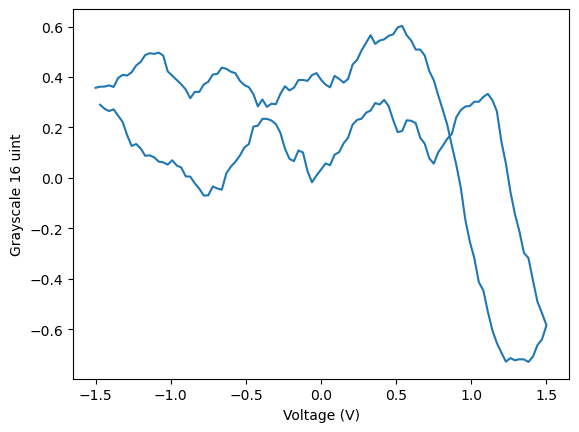

 70%|██████▉   | 351/503 [00:00<00:00, 752.22it/s]

(200,) (200,) (200,)


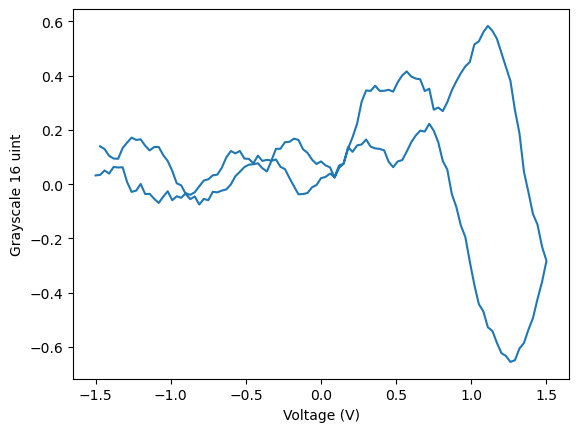

(200,) (200,) (200,)


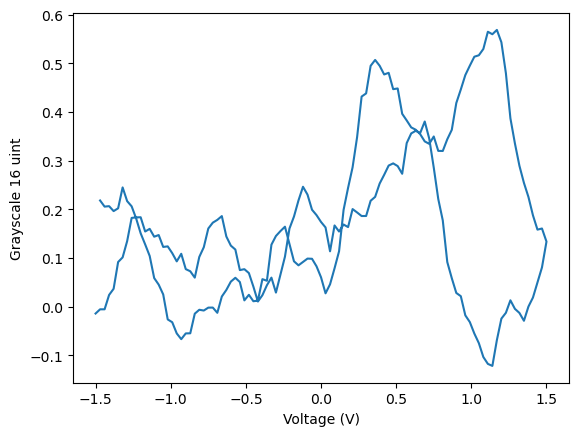

 90%|████████▉ | 451/503 [00:00<00:00, 766.95it/s]

(200,) (200,) (200,)


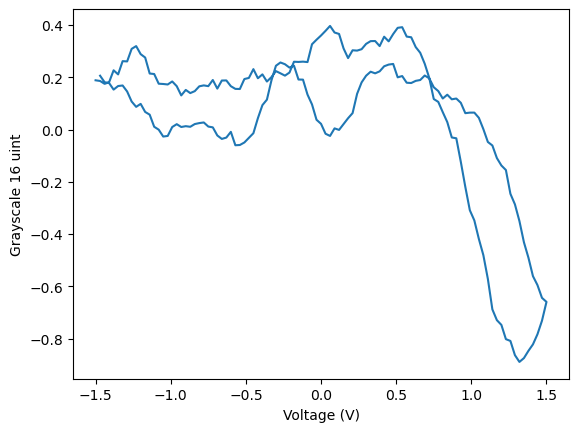

100%|██████████| 503/503 [00:00<00:00, 732.21it/s]


In [17]:
start = 150
for i, (y, x) in enumerate(tqdm(selected_cs)):
    if i%50==0:
        x_r, y_r = round(x), round(y)
        plot_voltage = sig#[start:start+1000]
        plot_intensity = savgol_filter(np.mean(np.mean(temp_array[:,x_r-2:x_r+3,y_r-2:y_r+3],axis=1),axis=1),21,2)[start:start+800]
        
        plot_voltage = plot_voltage.reshape(4,200).mean(axis=0)
        plot_intensity = plot_intensity.reshape(4,200)
        plot_intensity_std = plot_intensity.std(axis=0)
        plot_intensity_mean = plot_intensity.mean(axis=0)
        print(plot_voltage.shape, plot_intensity_mean.shape, plot_intensity_std.shape)
        # 绘制带有误差条的折线图
        #plt.errorbar(plot_voltage, plot_intensity_mean, fmt='-o', ecolor='r', capsize=5, capthick=2, markerfacecolor='blue',markersize =1.5)
        plt.plot(plot_voltage, plot_intensity_mean)#, fmt='-o', ecolor='r', capsize=5, capthick=2, markerfacecolor='blue',markersize =1.5)
        #plt.plot(plot_intensity_mean)
        plt.ylabel('Grayscale 16 uint')
        plt.xlabel('Voltage (V)')
        plt.show()

In [18]:
reservoir_o = []
start = 150
for i, (y, x) in enumerate(tqdm(centers)):
    if i%50==0:
        x_r, y_r = round(x), round(y)
        plot_intensity = savgol_filter(np.mean(np.mean(temp_array[:,x_r-2:x_r+3,y_r-2:y_r+3],axis=1),axis=1),21,2)[start:start+800]
        # 检查是否存在 NaN
        if np.isnan(plot_intensity).any():
            continue
        reservoir_o.append(plot_intensity)
reservoir_o = np.array(reservoir_o)
print(reservoir_o.shape)
# 查找 NaN 的坐标
nan_indices = np.argwhere(np.isnan(reservoir_o))

# # 输出 NaN 的坐标和值
# for index in nan_indices:
#     print(f"坐标: {tuple(index)}, 值: {reservoir_o[tuple(index)]}")

  0%|          | 0/17552 [00:00<?, ?it/s]/home/bio-lab/miniconda3/envs/picasso/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/bio-lab/miniconda3/envs/picasso/lib/python3.10/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
100%|██████████| 17552/17552 [00:00<00:00, 60898.44it/s]

(351, 800)


(800, 351)
0.0033051261910982043
0.04552772180926833
0.9425097730818689


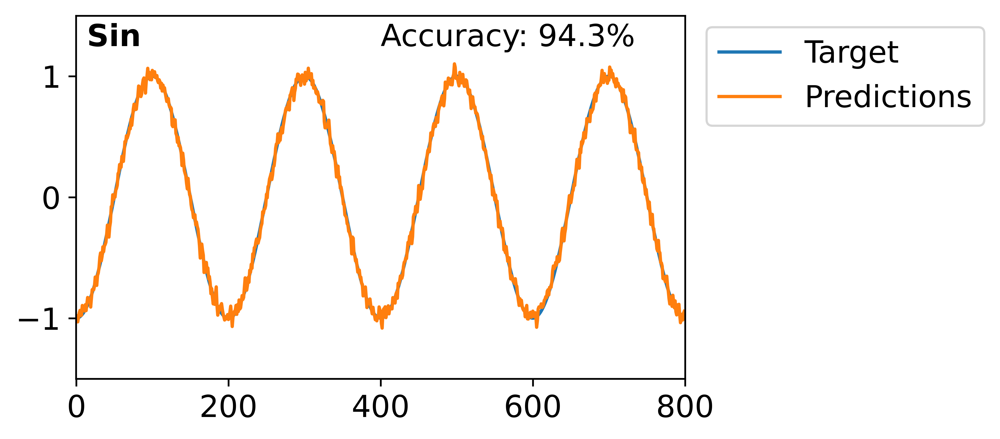

0.027173089854926433
0.3334
0.8351573785244653


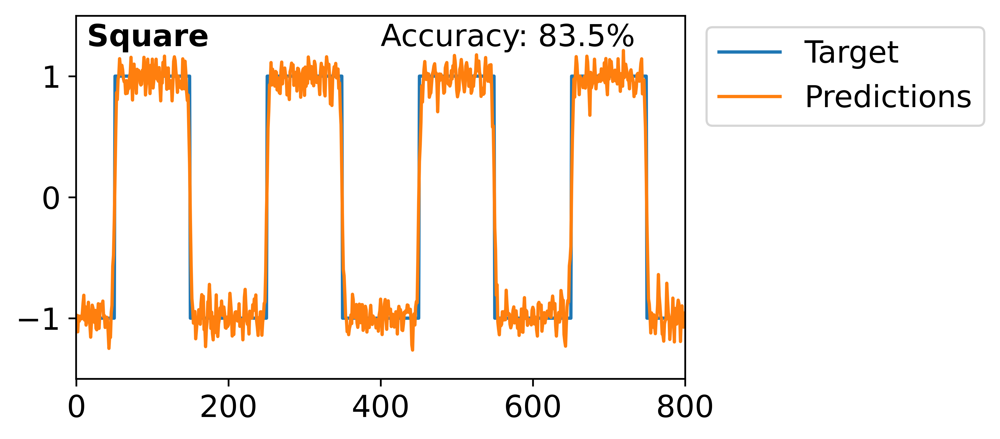

0.0031112139380068985
0.02903419316136772
0.9442217431429871


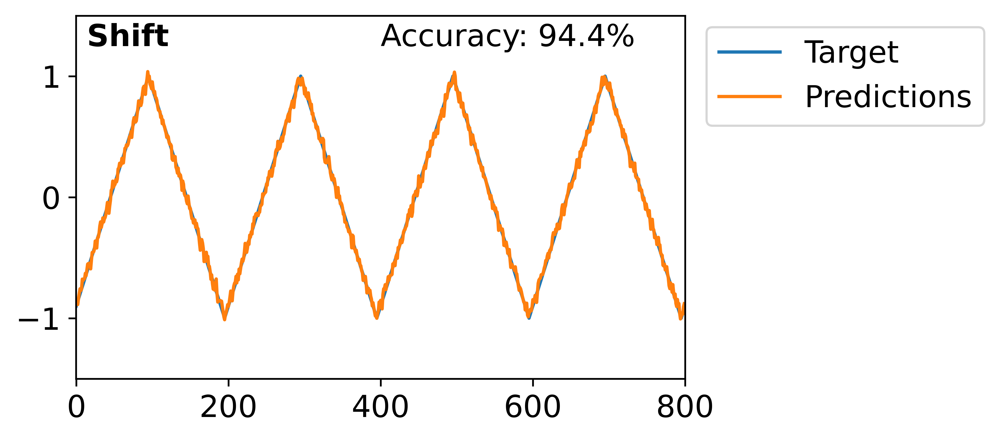

0.006713656762827795
1.9994004796163067
0.918063092791906


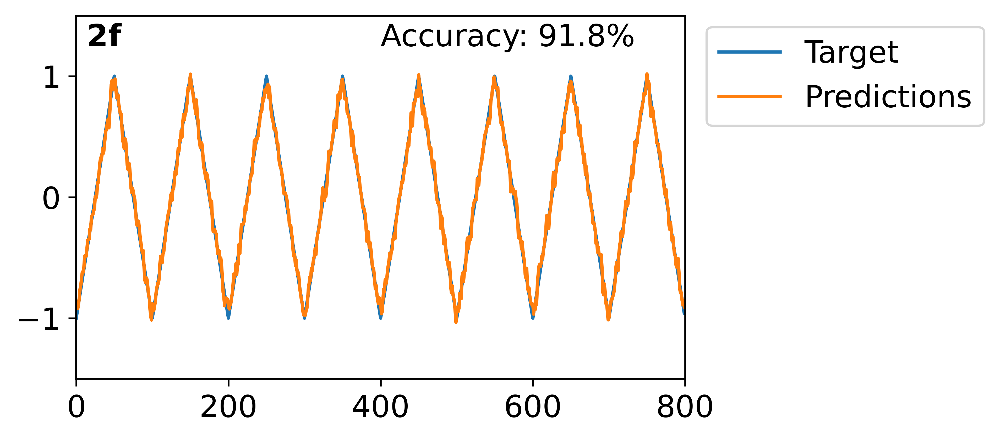

In [19]:
import numpy as np
from sklearn.linear_model import Ridge

# Step 1: Generate the Reservoir
def generate_reservoir(input_dim, reservoir_dim, spectral_radius=0.95):
    Win = np.random.rand(reservoir_dim, input_dim) - 0.5
    W = np.random.rand(reservoir_dim, reservoir_dim) - 0.5
    rhoW = max(abs(np.linalg.eigvals(W)))
    W *= spectral_radius / rhoW
    return Win, W

# Step 2: Collect States
def collect_states(data, Win, W, reservoir_dim):
    states = np.zeros((len(data), reservoir_dim))
    x = np.zeros(reservoir_dim)
    for t in range(len(data)):
        u = data[t]
        x = np.tanh(np.dot(Win, u) + np.dot(W, x))
        x = x + np.where(np.random.rand(*x.shape)>0.5,1,0) #np.random.rand(x.shape)
        states[t] = x
    return states

# Step 3: Ridge Regression
def train_ridge(states, target, alpha=1.0):
    ridge = Ridge(alpha=alpha)
    ridge.fit(states, target)
    return ridge

# Example usage
input_dim = 1
reservoir_dim = 200
Win, W = generate_reservoir(input_dim, reservoir_dim)
# input
period_length = 200
cycle = 4
rise = np.linspace(0,1,period_length//2,endpoint=False)
fall = np.linspace(1,0,period_length//2,endpoint=False)
one_period = np.concatenate([rise,fall])
input_triangle = np.tile(one_period,cycle)

# target
# sin
def sin_wave():
    target = np.sin(np.pi/2*(2*input_triangle-1))  # Example target data
    return target
# square
def square():
    target = np.where(input_triangle>0.5, 1,-1)
    return target
#shift
def shift_wave():
    target = np.zeros(*input_triangle.shape)
    target[:-5] = (2*input_triangle-1)[5:]
    target[-5:] = np.linspace(-1,1,period_length//2,endpoint=False)[:5]
    return target
# double
# input
def double2f_wave():
    period_length = 100
    cycle = 8
    rise = np.linspace(-1,1,period_length//2,endpoint=False)
    fall = np.linspace(1,-1,period_length//2,endpoint=False)
    one_period = np.concatenate([rise,fall])
    target = np.tile(one_period,cycle)
    return target

states = reservoir_o.T
print(states.shape)

def ridge_plot(name, target, states):
    
    ridge_model = train_ridge(states, target)

    # Predictions
    predictions = ridge_model.predict(states)
    def nmse_loss(y_pred, y_true):
        mse = np.sum((y_true - y_pred) ** 2)
        norm = np.sum(y_true**2)
        nmse_value = mse / norm
        print(nmse_value)
        return nmse_value

    def accuracy(y_pred, y_true):
        _nmse = nmse_loss(y_pred,y_true)
        _acc = 1- np.sqrt(_nmse)
        return _acc
    
    # based line:
    based = 2*input_triangle -1 
    acc = accuracy(predictions,target)
    acc_based = accuracy(based,target)
    # Display results
    import matplotlib.pyplot as plt
    plt.figure(figsize=(5,3),dpi=600)
    plt.rcParams.update({'font.size': 14})
    p1 = plt.plot(target, label='Target')
    p2 = plt.plot(predictions, label='Predictions')
    #p3 = plt.plot(based, label=f'Input {acc_based*100:.1f}%', linewidth =0.5)
    plt.ylim([-1.5,1.5])
    plt.yticks([-1,0,1])
    plt.xlim([-0.2,800.2])
    
    print(acc)
    plt.text(400, 1.25,f"Accuracy: {acc*100:.1f}%")
    plt.text(0.01, 1.25,f" {name}",fontdict={'weight':'bold'})
    plt.legend( bbox_to_anchor=(1.01, 1.01),loc='upper left')
    plt.show()
func_list = [sin_wave, square, shift_wave, double2f_wave]
name_list = ["Sin", "Square", "Shift", "2f"]
for i in range(4):
    targ_func = func_list[i]
    target = targ_func()
    name = name_list[i]
    ridge_plot(name, target, states)

0.0033051261910982043
0.04552772180926833
0.9425097730818689
0.027173089854926433
0.3334
0.8351573785244653


AttributeError: 'numpy.ndarray' object has no attribute 'set_ylabel'

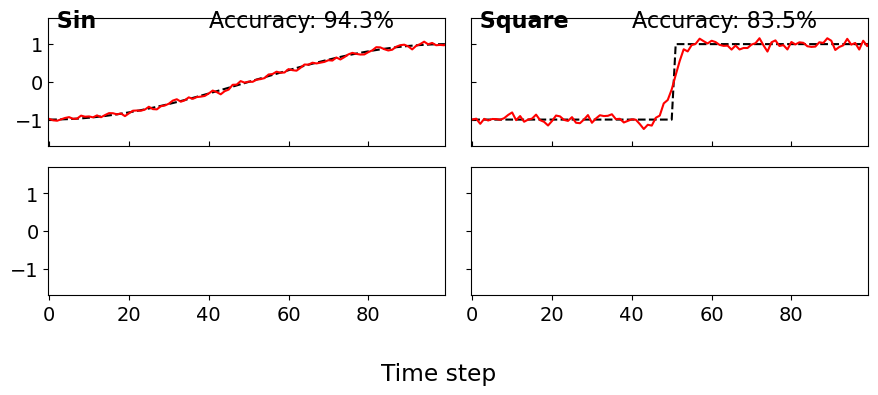

In [20]:
fig, axes = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(9, 4))
#plt.rcParams.update({'font.size': 14})
def ridge_plot_ax(name, target, states, ax):
    
    ridge_model = train_ridge(states, target)

    # Predictions
    predictions = ridge_model.predict(states)
    def nmse_loss(y_pred, y_true):
        mse = np.sum((y_true - y_pred) ** 2)
        norm = np.sum(y_true**2)
        nmse_value = mse / norm
        print(nmse_value)
        return nmse_value

    def accuracy(y_pred, y_true):
        _nmse = nmse_loss(y_pred,y_true)
        _acc = 1- np.sqrt(_nmse)
        return _acc
    
    # based line:
    based = 2*input_triangle -1 
    acc = accuracy(predictions,target)
    acc_based = accuracy(based,target)
    # Display results
    import matplotlib.pyplot as plt
    #plt.figure(figsize=(5,3),dpi=600)
    
    p1 = ax.plot(target, label='Target', linestyle='--', color='black')
    p2 = ax.plot(predictions, label='Reservoir output',color='red')
    #p3 = plt.plot(based, label=f'Input {acc_based*100:.1f}%', linewidth =0.5)
    ax.set_ylim([-1.7,1.7])
    ax.set_yticks([-1,0,1])
    ax.set_xlim([-0.2,99.2])
    ax.set_xlabel('')
    ax.tick_params(direction='in')
    
    print(acc)
    ax.text(40, 1.45,f"Accuracy: {acc*100:.1f}%",fontsize = 16)
    ax.text(0.01, 1.45,f" {name}",fontdict={'weight':'bold'},fontsize = 16)
    
func_list = [sin_wave, square, shift_wave, double2f_wave]
name_list = ["Sin", "Square", "Shift", "2f"]
for i in range(2):
    targ_func = func_list[i]
    target = targ_func()
    name = name_list[i]
    ridge_plot_ax(name, target, states, axes.flatten()[i])

fig.supxlabel('Time step')
fig.tight_layout()
axes[0].set_ylabel('Value')
legend = axes[0].legend( loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=2)
legend.set_frame_on(False)
fig.subplots_adjust(wspace=0.01,hspace=0.01)

plt.show()